In [78]:
import os

In [79]:
#Importando arquivo compactado
!wget https://storage.googleapis.com/mledu-datasets/cats_and_dogs_filtered.zip

--2024-04-23 01:04:12--  https://storage.googleapis.com/mledu-datasets/cats_and_dogs_filtered.zip
Resolving storage.googleapis.com (storage.googleapis.com)... 172.253.63.207, 142.250.31.207, 142.251.163.207, ...
Connecting to storage.googleapis.com (storage.googleapis.com)|172.253.63.207|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 68606236 (65M) [application/zip]
Saving to: ‘cats_and_dogs_filtered.zip’

cats_and_dogs_filte 100%[===================>]  65.43M  88.1MB/s    in 0.7s    

2024-04-23 01:04:13 (88.1 MB/s) - ‘cats_and_dogs_filtered.zip’ saved [68606236/68606236]



In [82]:
#Descompactando arquivo
!unzip cats_and_dogs_filtered.zip

Archive:  cats_and_dogs_filtered.zip
   creating: cats_and_dogs_filtered/
  inflating: cats_and_dogs_filtered/vectorize.py  
   creating: cats_and_dogs_filtered/validation/
   creating: cats_and_dogs_filtered/train/
   creating: cats_and_dogs_filtered/validation/dogs/
  inflating: cats_and_dogs_filtered/validation/dogs/dog.2127.jpg  
  inflating: cats_and_dogs_filtered/validation/dogs/dog.2126.jpg  
  inflating: cats_and_dogs_filtered/validation/dogs/dog.2125.jpg  
  inflating: cats_and_dogs_filtered/validation/dogs/dog.2124.jpg  
  inflating: cats_and_dogs_filtered/validation/dogs/dog.2123.jpg  
  inflating: cats_and_dogs_filtered/validation/dogs/dog.2122.jpg  
  inflating: cats_and_dogs_filtered/validation/dogs/dog.2121.jpg  
  inflating: cats_and_dogs_filtered/validation/dogs/dog.2120.jpg  
  inflating: cats_and_dogs_filtered/validation/dogs/dog.2119.jpg  
  inflating: cats_and_dogs_filtered/validation/dogs/dog.2118.jpg  
  inflating: cats_and_dogs_filtered/validation/dogs/dog.2117.

In [83]:
#Excluindo arquivo compactado
!rm -rf cats_and_dogs_filtered.zip

In [84]:
#instalando tensorflow
!pip install tensorflow

In [85]:
# Importando as bibliotecas necessárias
import os
import matplotlib.pyplot as plt
import tensorflow as tf

In [86]:
# Definindo os diretórios principais
dataset_dir = os.path.join(os.getcwd(), 'cats_and_dogs_filtered')
dataset_train_dir = os.path.join(dataset_dir, 'train')
dataset_validation_dir = os.path.join(dataset_dir, 'validation')

# Função para verificar a existência de um diretório
def verificar_diretorio(diretorio, nome_diretorio):
    if not os.path.exists(diretorio):
        print(f"O diretório {nome_diretorio} não foi encontrado em {diretorio}. Verifique se o caminho está correto.")
    else:
        print(f"O diretório {nome_diretorio} foi encontrado com sucesso.")

# Verificando os diretórios principais
verificar_diretorio(dataset_dir, "Dataset")
verificar_diretorio(dataset_train_dir, "Treinamento")
verificar_diretorio(dataset_validation_dir, "Validação")

# Verificando os subdiretórios de gatos e cachorros:
subdiretorios = ['cats', 'dogs']
for sub in subdiretorios:
    verificar_diretorio(os.path.join(dataset_train_dir, sub), f"Treinamento/{sub}")
    verificar_diretorio(os.path.join(dataset_validation_dir, sub), f"Validação/{sub}")

O diretório Dataset foi encontrado com sucesso.
O diretório Treinamento foi encontrado com sucesso.
O diretório Validação foi encontrado com sucesso.
O diretório Treinamento/cats foi encontrado com sucesso.
O diretório Validação/cats foi encontrado com sucesso.
O diretório Treinamento/dogs foi encontrado com sucesso.
O diretório Validação/dogs foi encontrado com sucesso.


In [87]:
#convertendo tamanho das imagens para 160 x 160
image_width = 160
image_height = 160
image_color_channel = 3 #canais de cor RGB
image_color_channel_size = 255 #representa o máximo valor que um pixel pode assumir em cada canal de cor
image_size = (image_width, image_height) #definindo o tamanho da imagem para redimensionamento
image_shape = image_size + (image_color_channel,) #definindo a forma completa da imagem que inclui não apenas a altura e largura, mas também os canais de cor

batch_size = 32 #quantidade de features por vez. 32 é default
epochs = 20 #épocas
learning_rate = 0.0001 #taxa de aprendizagem

class_names = ['cat', 'dog'] #saída (array), sendo posição 0 para cat e 1 para dog

In [88]:
# Carrega imagens do diretório de treinamento, redimensionando cada imagem para `image_size` 
#e agrupando-as em lotes de `batch_size`.
# O embaralhamento (`shuffle=True`) é utilizado para garantir a aleatoriedade dos dados, 
#melhorando a generalização durante o treinamento.
# Este objeto dataset é essencial para fornecer os dados de entrada para a rede neural, 
#permitindo a atualização efetiva dos parâmetros do modelo.
dataset_train = tf.keras.preprocessing.image_dataset_from_directory(
    dataset_train_dir,
    image_size = image_size,
    batch_size = batch_size,
    shuffle = True
)

Found 2000 files belonging to 2 classes.


In [89]:
# Carrega o conjunto de dados de validação a partir do diretório especificado (`dataset_validation_dir`), 
# redimensionando as imagens para o tamanho definido em `image_size` e agrupando-as em lotes de `batch_size`.
# O embaralhamento dos dados (`shuffle=True`) é mantido por consistência, 
#embora sua necessidade em validação possa ser menos crítica do que em treinamento.
# Este conjunto de dados é crucial para avaliar o desempenho do modelo em dados não vistos, 
#ajudando a identificar como o modelo generaliza para novas amostras.
# Diferentemente do conjunto de treinamento, os dados de validação são usados apenas para avaliação, 
#sem influenciar diretamente a atualização dos parâmetros do modelo.
dataset_validation = tf.keras.preprocessing.image_dataset_from_directory(
    dataset_validation_dir,
    image_size = image_size,
    batch_size = batch_size,
    shuffle = True
)

Found 1000 files belonging to 2 classes.


In [90]:
#dataset teste construído com base em um pedaço do dataset validação.
# neste caso, está sendo direcionado a quinta parte para teste
#a cardinalidade inicial é de 1000/32 = 31.25
# o dataset de teste fica com cardinalidade 6 * 32 imagens (features)
# e dataset de validação fica com cardinalidade 26 * 32 imagens (features)
#esse dataset será utilizado no final para testar o modelo
dataset_validation_cardinality = tf.data.experimental.cardinality(dataset_validation)
dataset_validation_batches = dataset_validation_cardinality // 5

dataset_test = dataset_validation.take(dataset_validation_batches)
dataset_validation = dataset_validation.skip(dataset_validation_batches)

print('Validation Dataset Cardinality: %d' % tf.data.experimental.cardinality(dataset_validation))
print('Test Dataset Cardinality: %d' % tf.data.experimental.cardinality(dataset_test))

Validation Dataset Cardinality: 26
Test Dataset Cardinality: 6


In [91]:
# A função plot_dataset é projetada para visualizar uma amostra de imagens de um dataset de TensorFlow.
# Ela plota as primeiras 9 imagens de uma batch do dataset em uma grade 3x3, 
# sem eixos, e com títulos correspondentes às suas classes.
# Esta visualização é útil para uma rápida inspeção visual das imagens e suas etiquetas, 
# facilitando a verificação da correta
# carga e processamento das imagens, bem como a diversidade e qualidade do dataset.
# A função assume que o dataset passado como argumento já está batchado 
# e que as imagens estão prontas para serem visualizadas.

def plot_dataset(dataset):
    plt.gcf().clear()  # Limpa a figura atual, se houver, para evitar sobreposições.
    plt.figure(figsize=(15,15))  # Define o tamanho da figura para plotar as imagens.

    for features, labels in dataset.take(1):  # Itera sobre uma única batch do dataset.
        for i in range(9):  # Loop para plotar 9 imagens dessa batch.
            plt.subplot(3,3,i+1)  # Organiza os plots em uma grade 3x3.
            plt.axis('off')  # Remove os eixos para uma visualização mais limpa.

            # Exibe a imagem i-ésima da batch, convertendo-a para o tipo uint8.
            plt.imshow(features[i].numpy().astype('uint8'))
            # Define o título do subplot como o nome da classe correspondente à etiqueta da imagem.
            plt.title(class_names[labels[i]])

2024-04-23 01:12:42.807353: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


<Figure size 640x480 with 0 Axes>

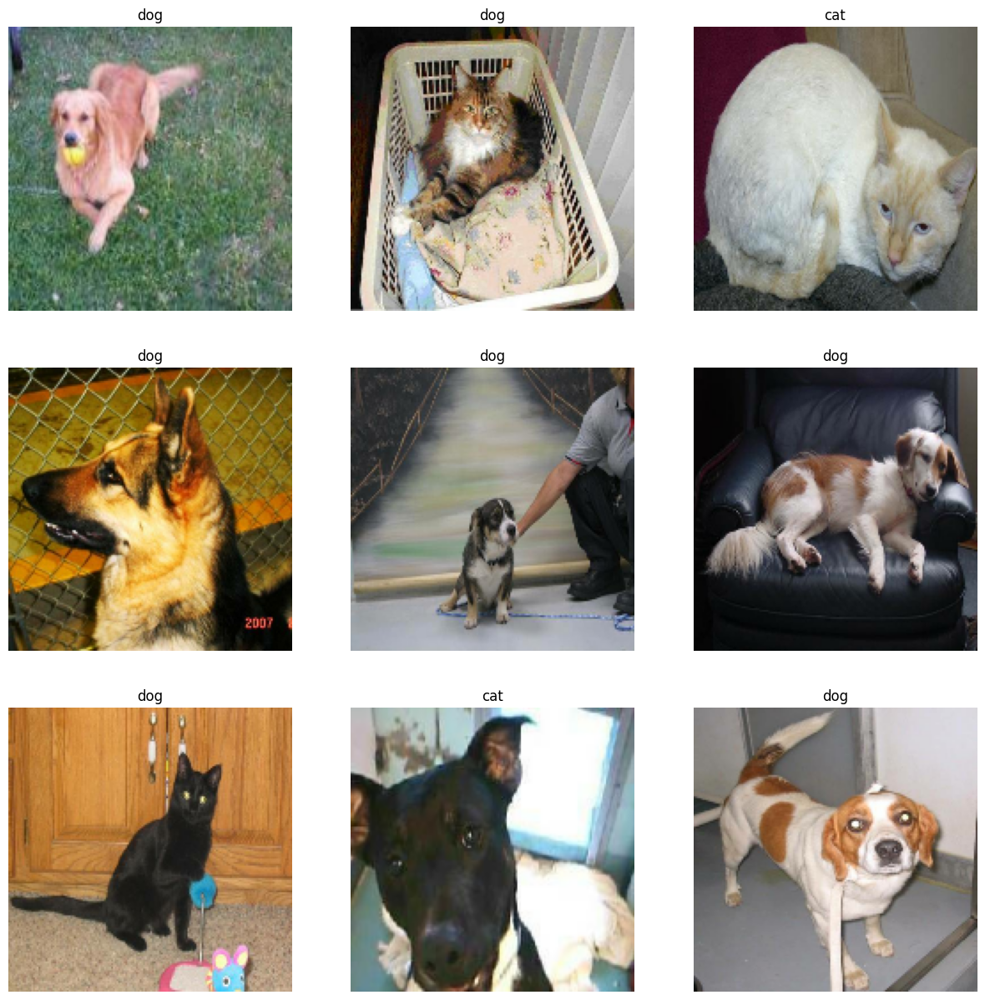

In [92]:
# Chamando a função com o dataset de treinamento.
plot_dataset(dataset_train)

2024-04-23 01:13:22.827993: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


<Figure size 640x480 with 0 Axes>

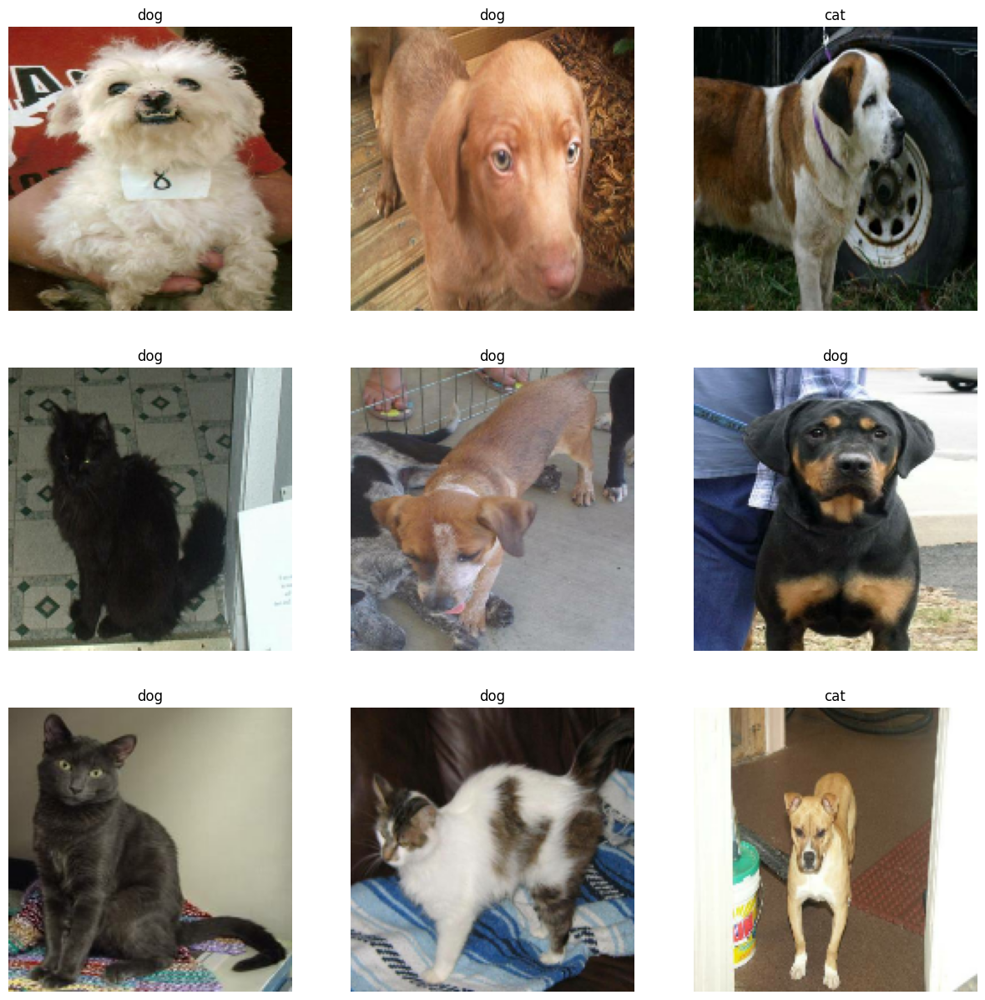

In [93]:
# Visualiza amostras do conjunto de validação.
plot_dataset(dataset_validation)

2024-04-23 01:13:24.263671: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


<Figure size 640x480 with 0 Axes>

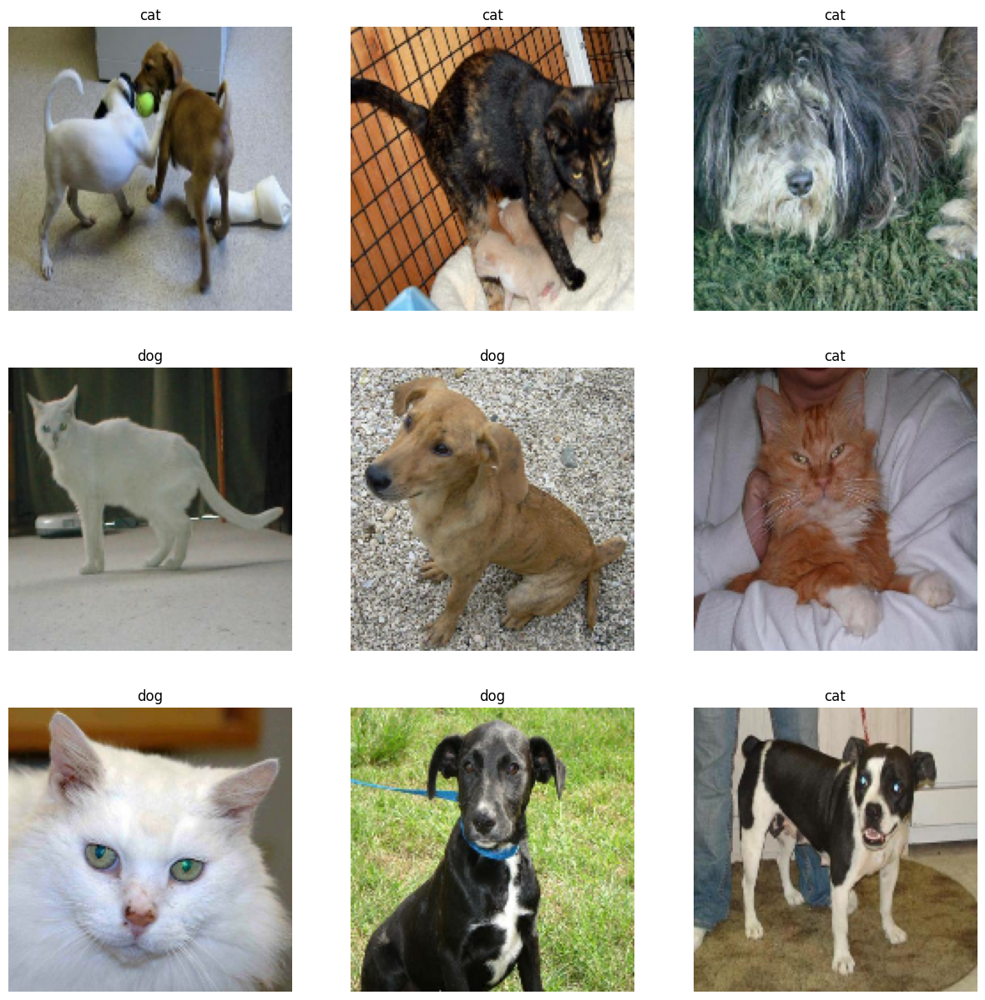

In [94]:
# Visualiza amostras do conjunto de teste.
plot_dataset(dataset_test)

In [103]:
# Aumenta o dataset com transformações para criar novas imagens, visando aumentar a generalização do modelo.
data_augmentation = tf.keras.Sequential([
    tf.keras.layers.RandomFlip('horizontal'),  # Espelha imagens horizontalmente.
    tf.keras.layers.RandomRotation(0.2),  # Rotaciona as imagens aleatoriamente em 20% em torno do centro.
    tf.keras.layers.RandomZoom(0.2),  # Aplica um zoom aleatório de até 20% nas imagens.
    tf.keras.layers.RandomContrast(0.2),
    tf.keras.layers.RandomBrightness(0.2),
])

In [104]:
# Define a função para plotar imagens após aplicação do aumento de dados.
#função para plotar resultado da rotação de fitures
def plot_dataset_data_augmentation(dataset):

    plt.gcf().clear() # Limpa a figura atual do matplotlib.
    plt.figure(figsize= (15,15)) # Define o tamanho da figura para plotagem.

    # Itera sobre o dataset, mas toma apenas o primeiro lote de imagens.
    for features, _ in dataset.take(1):
        # Seleciona uma única imagem do lote.
        feature = features[0]

        for i in range(9): # Loop para gerar e plotar 9 versões aumentadas de uma imagem.
        
            feature_data_augumentation = data_augmentation(tf.expand_dims(feature,0))
            # Prepara um subplot para cada imagem aumentada.
            plt.subplot(3,3, i + 1)
            plt.axis('off') # Remove os eixos para uma visualização mais limpa.

            plt.imshow(feature_data_augumentation[0] / image_color_channel_size)

2024-04-23 01:28:01.422979: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


<Figure size 640x480 with 0 Axes>

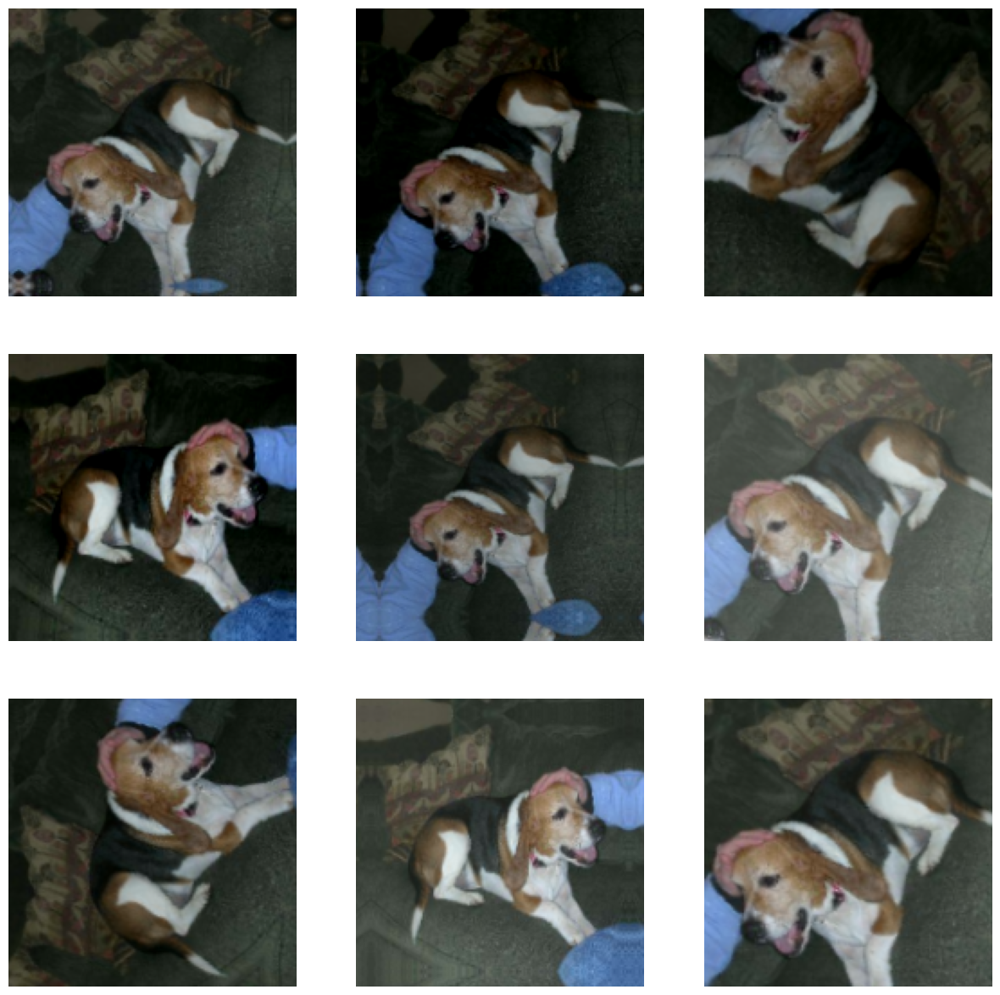

In [105]:
# Exibe exemplos de imagens do conjunto de treino após aplicação do aumento de dados.
plot_dataset_data_augmentation(dataset_train)

In [106]:
#fazendo uso de um modelo já treinado de transfer learning

#instanciando um modelo que iremos usar para aprendizagem
model_transfer_learning = tf.keras.applications.MobileNetV2(
    input_shape = image_shape,
    include_top = False,
    weights = 'imagenet'
)

#setando trainable como falso para que não tenha os parametros atualizados durante o treinamento
#pois queremos usar um modelo já pronto e usa-lo do jeito que ele está
model_transfer_learning.trainable = False

#summary analisar um resumo do modelo
model_transfer_learning.summary()

Model: "mobilenetv2_1.00_160"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_8       │ (None, 160, 160,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ Conv1 (Conv2D)      │ (None, 80, 80,    │        864 │ input_layer_8[0]… │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ bn_Conv1            │ (None, 80, 80,    │        128 │ Conv1[0][0]       │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ Conv1_relu (ReLU)   │ (None, 80, 80,    │          0 │ bn_Conv1[0][0]    │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_dept… │ (None, 80, 80,    │        288 │ Conv1_relu[0][0]  │
│ (DepthwiseConv2D)   │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_dept… │ (None, 80, 80,    │        128 │ expanded_conv_de… │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_dept… │ (None, 80, 80,    │          0 │ expanded_conv_de… │
│ (ReLU)              │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_proj… │ (None, 80, 80,    │        512 │ expanded_conv_de… │
│ (Conv2D)            │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_proj… │ (None, 80, 80,    │         64 │ expanded_conv_pr… │
│ (BatchNormalizatio… │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_expand      │ (None, 80, 80,    │      1,536 │ expanded_conv_pr… │
│ (Conv2D)            │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_expand_BN   │ (None, 80, 80,    │        384 │ block_1_expand[0… │
│ (BatchNormalizatio… │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_expand_relu │ (None, 80, 80,    │          0 │ block_1_expand_B… │
│ (ReLU)              │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_pad         │ (None, 81, 81,    │          0 │ block_1_expand_r… │
│ (ZeroPadding2D)     │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_depthwise   │ (None, 40, 40,    │        864 │ block_1_pad[0][0] │
│ (DepthwiseConv2D)   │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_depthwise_… │ (None, 40, 40,    │        384 │ block_1_depthwis… │
│ (BatchNormalizatio… │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_depthwise_… │ (None, 40, 40,    │          0 │ block_1_depthwis… │
│ (ReLU)              │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_project     │ (None, 40, 40,    │      2,304 │ block_1_depthwis

 Total params: 2,257,984 (8.61 MB)

 Trainable params: 0 (0.00 B)

 Non-trainable params: 2,257,984 (8.61 MB)

In [108]:
#criando o modelo do tipo sequencial, para que uma camada seja aplicada após a outra em sequencia
model = tf.keras.models.Sequential([
    # Primeira etapa é responsável por fazer o rescaling das imagens de 160x160
    # Normalização de valores para que vá de 0 a 1 e não de 0 a 255
    # Esta camada ajusta os valores dos pixels para o intervalo [-1, 1], o que é uma prática comum ao usar
    tf.keras.layers.Rescaling(
        1. / (image_color_channel_size / 2),
        offset = -1,
        input_shape = image_shape
    ),

    # Usando o conjunto de transformações de aumento de dados para o treino das camadas internas
    # Isso ajuda a criar variações das imagens de entrada para melhorar a generalização do modelo
    data_augmentation,
    # Incorporando o modelo de transferência de aprendizado (MobileNetV2) como uma camada no modelo
    # Os pesos são pré-treinados no ImageNet e não são atualizados durante o treinamento
    model_transfer_learning,
    # Aplicando a camada de GlobalAveragePooling2D para reduzir a dimensionalidade da saída 
    # do modelo_transfer_learning
    # Isso ajuda a condensar as características extraídas em um vetor mais compacto
    tf.keras.layers.GlobalAveragePooling2D(),
    # Adicionando uma camada de Dropout para reduzir o overfitting
    # Dropout "desliga" aleatoriamente uma proporção dos neurônios durante o treinamento, 
    # o que ajuda a prevenir a coadaptação
    tf.keras.layers.Dropout(0.2),
    #quero apenas 1 valor na saída. e a sigmoid retorna sempre -1 e 1 independente do valor que chegar nela
    # Camada de saída com uma única unidade e ativação sigmoid
    # A função sigmoid é usada para obter uma probabilidade de a imagem ser um cão ou um gato
    tf.keras.layers.Dense(1, activation= 'sigmoid')
])

# Compilando o modelo
# Adam é usado como otimizador, uma escolha comum que combina os benefícios do RMSProp 
# e do Gradiente Descendente com Momento
# BinaryCrossentropy é a função de perda apropriada para classificação binária
# A precisão ('accuracy') é usada como métrica para monitorar o desempenho do modelo durante o treinamento
model.compile(
    optimizer = tf.keras.optimizers.Adam(learning_rate = learning_rate),
    loss = tf.keras.losses.BinaryCrossentropy(),
    metrics = ['accuracy']
)

# Exibindo um resumo do modelo
# Isso mostra a estrutura do modelo, incluindo o número de parâmetros treináveis e não treináveis em cada camada
model.summary()

Model: "sequential_8"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ rescaling_3 (Rescaling)         │ (None, 160, 160, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ sequential_6 (Sequential)       │ (None, 160, 160, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ mobilenetv2_1.00_160            │ (None, 5, 5, 1280)     │     2,257,984 │
│ (Functional)                    │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d_3      │ (None, 1280)           │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_3 (Dropout)             │ (None, 1280)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3 (Dense)                 │ (None, 1)              │         1,281 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,259,265 (8.62 MB)

 Trainable params: 1,281 (5.00 KB)

 Non-trainable params: 2,257,984 (8.61 MB)

In [109]:
history = model.fit(
    # O primeiro argumento é o conjunto de dados de treinamento.
    # Este é o conjunto de imagens de cães e gatos que o modelo usará para aprender durante o treinamento.
    dataset_train,
    # O argumento 'validation_data' especifica o conjunto de dados de validação.
    # Durante o treinamento, após cada época, o modelo é avaliado neste conjunto de dados
    # para monitorar o desempenho em dados não vistos durante o treinamento.
    # Isso ajuda a identificar problemas como overfitting.
    validation_data = dataset_validation,
    # O argumento 'epochs' define o número de vezes que o algoritmo de treinamento trabalhará 
    # através de todo o conjunto de dados de treinamento.
    # Uma "época" é uma passagem completa através de todas as amostras no conjunto de dados de treinamento.
    epochs = epochs
)

Epoch 1/20
63/63 ━━━━━━━━━━━━━━━━━━━━ 34s 469ms/step - accuracy: 0.4921 - loss: 0.9505 - val_accuracy: 0.5037 - val_loss: 0.8578
Epoch 2/20
63/63 ━━━━━━━━━━━━━━━━━━━━ 29s 457ms/step - accuracy: 0.5025 - loss: 0.7447 - val_accuracy: 0.4740 - val_loss: 0.8551
Epoch 3/20
63/63 ━━━━━━━━━━━━━━━━━━━━ 42s 469ms/step - accuracy: 0.5146 - loss: 0.7325 - val_accuracy: 0.4777 - val_loss: 0.8385
Epoch 4/20
63/63 ━━━━━━━━━━━━━━━━━━━━ 29s 467ms/step - accuracy: 0.5029 - loss: 0.7549 - val_accuracy: 0.5025 - val_loss: 0.7991
Epoch 5/20
63/63 ━━━━━━━━━━━━━━━━━━━━ 31s 486ms/step - accuracy: 0.4721 - loss: 0.7487 - val_accuracy: 0.5186 - val_loss: 0.7610
Epoch 6/20
63/63 ━━━━━━━━━━━━━━━━━━━━ 30s 470ms/step - accuracy: 0.5038 - loss: 0.7397 - val_accuracy: 0.5074 - val_loss: 0.7392
Epoch 7/20
63/63 ━━━━━━━━━━━━━━━━━━━━ 29s 468ms/step - accuracy: 0.4781 - loss: 0.7369 - val_accuracy: 0.5087 - val_loss: 0.7522
Epoch 8/20
63/63 ━━━━━━━━━━━━━━━━━━━━ 30s 471ms/step - accuracy: 0.4689 - loss: 0.7454 - val_accu

In [111]:
# Descongelar as camadas superiores do MobileNetV2
additional_epochs = 10

model_transfer_learning.trainable = True

# Escolha quantas camadas do topo você quer descongelar
for layer in model_transfer_learning.layers[:-20]:  # Exemplo: descongela as últimas 20 camadas
    layer.trainable = False

# Recompile o modelo para aplicar as mudanças
model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.00001),  # Use uma taxa de aprendizado menor para fine-tuning
              loss=tf.keras.losses.BinaryCrossentropy(),
              metrics=['accuracy'])

# Continue o treinamento (Fine-Tuning)
history_fine_tuning = model.fit(
    dataset_train,
    validation_data=dataset_validation,
    epochs=additional_epochs  # Número adicional de épocas para o fine-tuning
)

Epoch 1/10
 2/63 ━━━━━━━━━━━━━━━━━━━━ 28s 469ms/step - accuracy: 0.3984 - loss: 0.7533

63/63 ━━━━━━━━━━━━━━━━━━━━ 44s 576ms/step - accuracy: 0.4856 - loss: 0.7450 - val_accuracy: 0.5000 - val_loss: 0.7587
Epoch 2/10
63/63 ━━━━━━━━━━━━━━━━━━━━ 35s 553ms/step - accuracy: 0.5348 - loss: 0.7104 - val_accuracy: 0.5136 - val_loss: 0.7437
Epoch 3/10
63/63 ━━━━━━━━━━━━━━━━━━━━ 34s 544ms/step - accuracy: 0.4957 - loss: 0.7241 - val_accuracy: 0.4814 - val_loss: 0.7646
Epoch 4/10
63/63 ━━━━━━━━━━━━━━━━━━━━ 41s 543ms/step - accuracy: 0.5368 - loss: 0.7118 - val_accuracy: 0.5087 - val_loss: 0.7535
Epoch 5/10
63/63 ━━━━━━━━━━━━━━━━━━━━ 42s 557ms/step - accuracy: 0.4839 - loss: 0.7326 - val_accuracy: 0.5322 - val_loss: 0.7476
Epoch 6/10
63/63 ━━━━━━━━━━━━━━━━━━━━ 40s 546ms/step - accuracy: 0.5103 - loss: 0.7116 - val_accuracy: 0.5309 - val_loss: 0.7437
Epoch 7/10
63/63 ━━━━━━━━━━━━━━━━━━━━ 34s 541ms/step - accuracy: 0.4795 - loss: 0.7240 - val_accuracy: 0.4975 - val_loss: 0.7497
Epoch 8/10
63/63 ━━━━━━━━━━━━━━━━━━━━ 41s 541ms/step - accuracy: 0.5310 - loss: 0.7111 - val_accuracy: 0.507

In [112]:
# Definição da função plot_dataset_predictions para visualizar previsões do modelo
def plot_dataset_predictions(dataset):
    # Obtendo um lote de imagens e rótulos do conjunto de dados
    features, labels = dataset.as_numpy_iterator().next()

    # Fazendo previsões para o lote de imagens obtido
    predictions = model.predict_on_batch(features).flatten()
    # Convertendo as probabilidades de previsão em rótulos de classe binários (0 ou 1)
    # com base em um limiar de 0.5
    predictions = tf.where(predictions < 0.5, 0, 1)

    # Imprimindo os rótulos reais e as previsões para comparação
    print('Labels:      %s' % labels)
    print('Predictions: %s' % predictions.numpy())

    # Preparando uma nova figura para visualização
    plt.gcf().clear()
    plt.figure(figsize=(15,15))

    # Iterando sobre as primeiras 9 imagens do lote para visualizar
    for i in range(9):
        # Criando um subplot para cada imagem
        plt.subplot(3,3, i + 1)
        plt.axis('off')  # Removendo os eixos para uma visualização mais limpa

        # Exibindo a imagem
        plt.imshow(features[i].astype('uint8'))
        # Adicionando o título ao subplot, indicando o rótulo predito
        # A função 'class_names' é usada para mapear o rótulo numérico para o nome da classe correspondente
        plt.title(class_names[predictions[i]])

Labels:      [0 0 0 1 1 0 1 1 0 0 1 1 1 0 0 0 0 1 0 1 1 1 0 1 0 0 0 1 1 1 0 1]
Predictions: [1 0 0 0 1 1 1 0 1 0 0 1 0 1 1 0 1 1 1 1 1 0 0 1 0 1 1 0 0 0 1 0]


<Figure size 640x480 with 0 Axes>

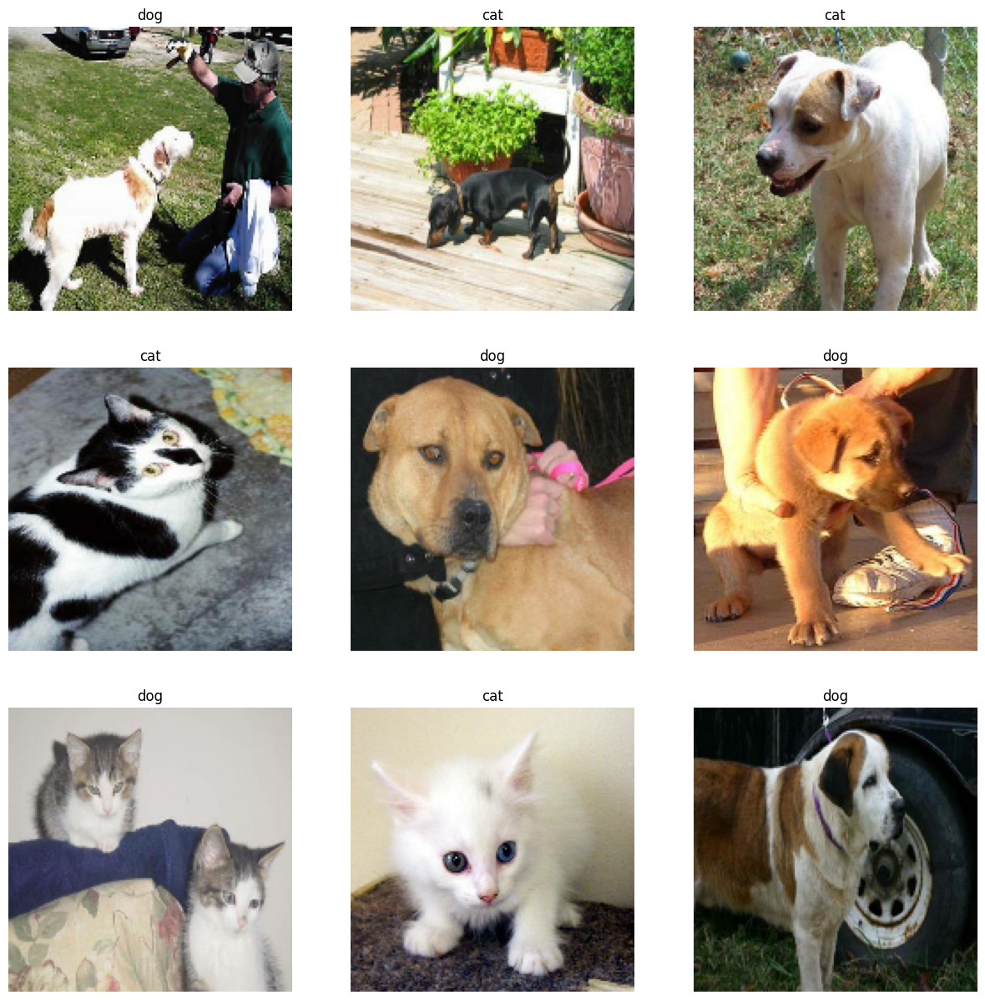

In [113]:
#executando dataset de teste
plot_dataset_predictions(dataset_test)

In [114]:
#salvando modelo para enviar para produção
# Definindo o caminho do diretório onde o modelo será salvo
directory = 'path/to'

# Verificando se o diretório especificado existe. Se não existir, ele será criado.
if not os.path.exists(directory):
    os.makedirs(directory)

# Salvando o modelo treinado no caminho especificado.
model.save('path/to/model.keras')

In [ ]:
#carregando modelo
#model = tf.keras.models.load_model('path/to/model.keras')

In [115]:
def plot_model():
    accuracy = history.history['accuracy'] # Acessa a precisão do treinamento
    val_accuracy = history.history['val_accuracy'] # Acessa a precisão da validação
    loss = history.history['loss'] # Acessa a perda do treinamento
    val_loss = history.history['val_loss'] # Acessa a perda da validação
    epochs_range = range(epochs) # Cria uma sequência de épocas para o eixo X dos gráficos

    plt.gcf().clear() # Limpa a figura atual para evitar sobreposições
    plt.figure(figsize=(15,8)) # Define o tamanho da figura para os gráficos

    plt.subplot(1,2,1) # Prepara o primeiro subplot para a precisão
    plt.title('Training and Validation Accuracy') # Define o título do primeiro subplot
    plt.plot(epochs_range, accuracy, label='Training Accuracy') # Plota a precisão do treinamento
    plt.plot(epochs_range, val_accuracy, label='Validation Accuracy') # Plota a precisão da validação
    plt.legend(loc='lower right') # Adiciona a legenda no canto inferior direito

    plt.subplot(1,2,2) # Prepara o segundo subplot para a perda
    plt.title('Training and Validation Loss') # Define o título do segundo subplot
    plt.plot(epochs_range, loss, label='Training Loss') # Plota a perda do treinamento
    plt.plot(epochs_range, val_loss, label='Validation Loss') # Plota a perda da validação
    plt.legend(loc='upper right') # Adiciona a legenda no canto superior direito

    plt.show() # Exibe os gráficos

<Figure size 640x480 with 0 Axes>

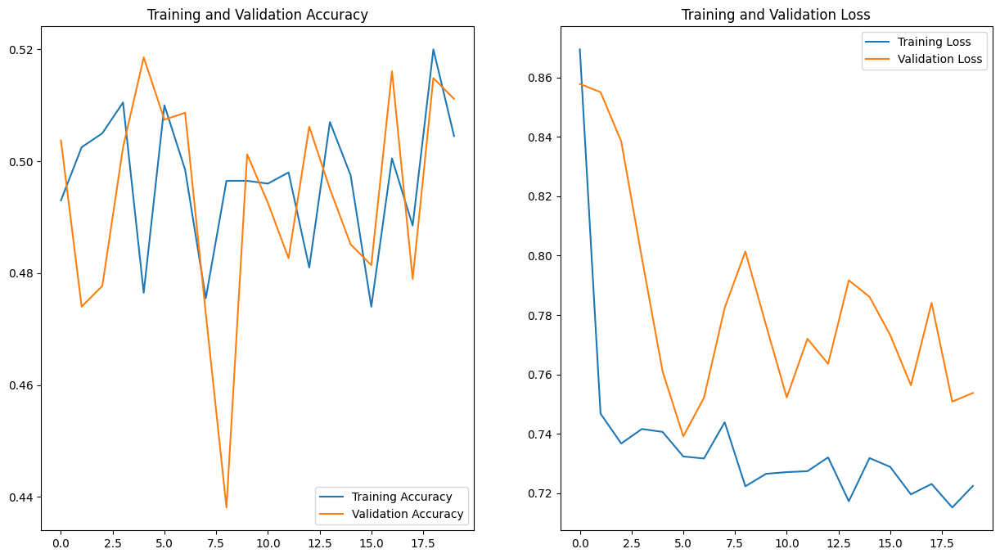

In [116]:
# Chamando a função para plotar os gráficos
plot_model()